<a href="https://colab.research.google.com/github/dnevo/ImageProcessing/blob/main/ImageProcessingRecitation_12_Fourier2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import requests
from io import BytesIO
from ipywidgets import interactive
import matplotlib.pyplot as plt
import plotly.express as px
import PIL
from numpy.fft import fft2, ifft2, fftshift, ifftshift
import numpy as np
π = np.pi

In [ ]:
GITHUB_PATH = 'https://raw.githubusercontent.com/dnevo/ImageProcessing/main/images/'

In [ ]:
def read_file(file_name:str, file_path:str=GITHUB_PATH) -> np.ndarray:
    '''
    Accept an image file name (defaulty located in GitHub) and return the image 
    in a numpy array.

    Args:
        file_name: the file name
        file_path: the file path.. Default value is Doron's Github repo.

    Returns:
        the image converted into a Numpy array.
    '''
    file_path = os.path.join(file_path, file_name)
    response = requests.get(file_path)
    fp = BytesIO(response.content)

    img_pil = PIL.Image.open(fp)
    return np.array(img_pil, dtype='int16')

In [ ]:
def plot_axis(splot, x, xlabel, y, ylabel, xlim=False, ylim=False):
    splot.plot(x, y)
    if splot == plt:
        splot.xlabel(xlabel)
        splot.ylabel(ylabel)
        if xlim:
            plt.xlim(xlim)
        if ylim:
            plt.ylim(ylim)
    else:
        splot.set_xlabel(xlabel)
        splot.set_ylabel(ylabel)
        if xlim:
            splot.set_xlim(xlim)
        if ylim:
            splot.set_ylim(ylim)
    splot.axhline(y=0, color='k')
    splot.axvline(x=0, color='k')
    splot.grid()

#Polar and cartesian presentations

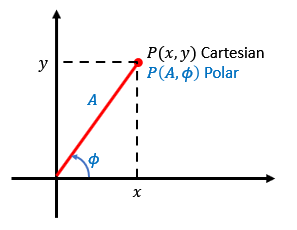

For each specific frequency there are 2 degrees of freedom: amplitude $(A)$ and phase $(\phi)$.

In polar presentation: amplitude $(A)$ and phase $(\phi)$.

This is equivalent to cartesian presentation: $(x,y)$ or represent as a complex number: $z=x+iy$.  $(i=\sqrt{-1})$

Therefore the coefficients for the frequencies are complex numbers representing the amplitude $(A)$ and phase $(\phi)$.

$A = |z| = \sqrt{x^2+y^2}$

$z=|z|(\cos\phi + i \sin \phi)$

#Nyquist frequency

The sampling frequency should be at least twice (x2) than the data frequency, in order to reproduce the signal.

##Sampling

In most real life cases, we do not know the analytic function (ex. $f(t)=\sin(t)$, we just have samples at discrete locations $(t=1,2,\dots,n)$

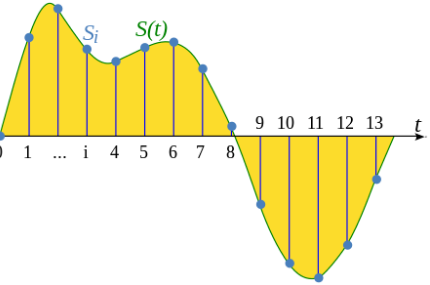

##Aliasing

Example: instead of sampling twice every cycle, we sample every $3/4$ cycle:

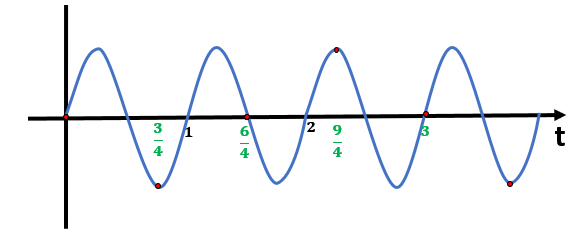

As a result, the signal is mirrored around the center. This phenomenon is called aliasing.

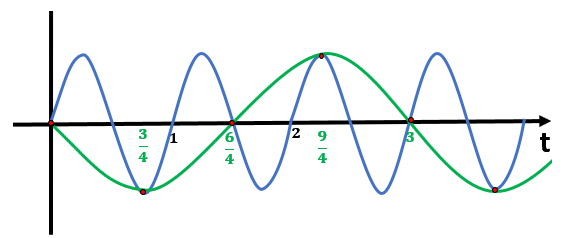

We should distinguish between:
- Fourier Transform
- Discrete Fourier Transform (DFT)
- Fast Fourier Transform (FFT) - algorithm to implement DFT

#2D Fourier Transform

A 2d Image $(B)$ can be represented using the standard (2d) base:

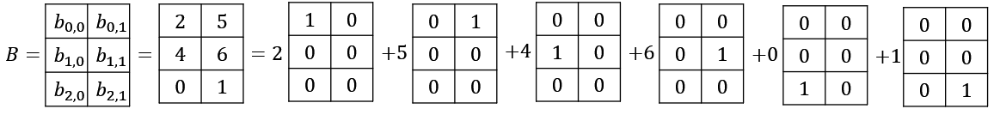

Following DFT the image is represented in the Frequencies domain

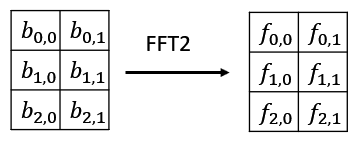

$B=f_{0,0}\cdot F_{0,0}+f_{0,1}\cdot F_{0,1}+f_{1,0}\cdot F_{1,0}+f_{1,1}\cdot F_{1,1}+f_{2,0}\cdot F_{2,0}+f_{2,1}\cdot F_{2,1}$

$F_{0,0}$ - the DC function - the function of frequency=0 in x-axis and frequency=0 in the y-axis. This is a matrix in which all components are the same (constant values).

$f_{0,0}$ - the coefecient of $F_{0,0}$ - a scalar - this is the mean gray value of the image.

$f_{0,1}$ - the coefecient of a function of sine with one cycle in horizontal axis, and zero cycles in the vertical axis (i.e. constant value in y axis).


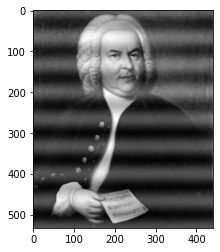

In [ ]:
img1 = read_file(file_name='fftDemo1.tiff') / 255
plt.imshow(img1, cmap='gray');

Q: what is the frequency of the y axis wave?

In [ ]:
f1 = fft2(img1)

In [ ]:
print(int(img1.mean() * 255), int(255*f1[0,0].real/img1.size))

79 79


In [ ]:
fig = px.imshow(f1.real, color_continuous_scale='gray')
fig.update_layout(coloraxis_showscale=False)

In [ ]:
mag = abs(f1)  # Calculate the complex magnitude
mag = np.log1p(mag) # Logarithm scaling
fig = px.imshow(mag.real, color_continuous_scale='gray')
fig.update_layout(coloraxis_showscale=False)

Demo of aliasing:

In [ ]:
print(mag.real[0,:4])
print(mag.real[0,-3:])

[11.19716647  9.60786308  9.04699529  7.86234664]
[7.86234664 9.04699529 9.60786308]


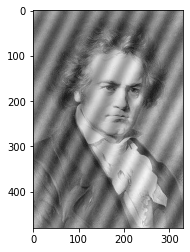

In [ ]:
img2 = read_file(file_name='fftDemo2.tiff') / 255
plt.imshow(img2, cmap='gray');

Q: why the image get darker when we get far from the corner 0,0?
As frequency gets higher, it's amplitude gets lower. By nature it is difficult to make big jumps in a short time.

Q: why is it symetric aroung the center?
Because of Nyquist law. The maximum frequency that can be reproduced is n/2 which is between the (left) edge and the center (max freq.), and it will be mirrored from the center to right edge.



##FFT shift

In order to see in a more "user friendly" manner:

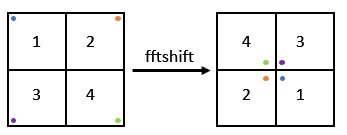

In [ ]:
f2 = fft2(img2)
fig = px.imshow(np.log(np.abs(fftshift(f2))**2), color_continuous_scale='gray')
fig.update_layout(coloraxis_showscale=False)

##noise removal

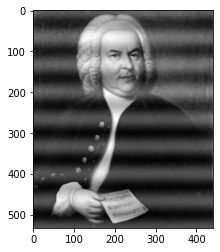

In [ ]:
img1 = read_file(file_name='fftDemo1.tiff') / 255
plt.imshow(img1, cmap='gray');

In [ ]:
f1 = fft2(img1)
f1 = fftshift(f1)
f1a = np.log(np.abs(f1)**2)
fig = px.imshow(f1a, color_continuous_scale='gray')
fig.update_layout(coloraxis_showscale=False)

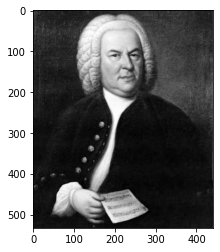

In [ ]:
f1[266-8,220] = 0
f1[266+8,220] = 0
img_c = ifft2(ifftshift(f1)).real
plt.imshow(img_c, cmap='gray');